In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt
from google.colab import drive
drive.mount('/content/drive')



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Step 1: Load the shapefile
gdf = gpd.read_file('/content/drive/MyDrive/ESIIL Project Data/Population Data/Colorado_County_Boundaries_Shapefiles')

# Step 2: Load the population CSV
df = pd.read_csv('/content/drive/MyDrive/ESIIL Project Data/Population Data/Pop_Data_90-23_CSV.csv')

# OPTIONAL: Inspect column names
print(df.columns)
print(gdf.columns)

# Clean up and normalize merge keys
df['FULL'] = df['FULL'].str.replace(' County', '', regex=False).str.strip().str.upper()
gdf['COUNTY'] = gdf['COUNTY'].str.strip().str.upper()

# Step 3: Merge on matching columns
merged = gdf.merge(df, left_on='COUNTY', right_on='FULL')

merged

Index(['id', 'countyfips', 'FULL', 'YEAR', 'TOTAL POPULATION'], dtype='object')
Index(['OBJECTID', 'COUNTY', 'FULL', 'LABEL', 'CNTY_FIPS', 'NUM_FIPS',
       'CENT_LAT', 'CENT_LONG', 'US_FIPS', 'geometry'],
      dtype='object')


,OBJECTID,COUNTY,FULL_x,LABEL,CNTY_FIPS,NUM_FIPS,CENT_LAT,CENT_LONG,US_FIPS,geometry,id,countyfips,FULL_y,YEAR,TOTAL POPULATION
0,1,LARIMER,Larimer County,Larimer,069,69,40.666413,-105.461155,08069,"POLYGON ((-105.05672 40.34928, -105.0567 40.34...",37,69,LARIMER,1985,"170,724"
1,1,LARIMER,Larimer County,Larimer,069,69,40.666413,-105.461155,08069,"POLYGON ((-105.05672 40.34928, -105.0567 40.34...",102,69,LARIMER,1986,"174,980"
2,1,LARIMER,Larimer County,Larimer,069,69,40.666413,-105.461155,08069,"POLYGON ((-105.05672 40.34928, -105.0567 40.34...",167,69,LARIMER,1987,"178,151"
3,1,LARIMER,Larimer County,Larimer,069,69,40.666413,-105.461155,08069,"POLYGON ((-105.05672 40.34928, -105.0567 40.34...",232,69,LARIMER,1988,"180,220"
4,1,LARIMER,Larimer County,Larimer,069,69,40.666413,-105.461155,08069,"POLYGON ((-105.05672 40.34928, -105.0567 40.34...",297,69,LARIMER,1989,"183,598"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2491,64,HUERFANO,Huerfano County,Huerfano,055,55,37.684680,-104.960585,08055,"POLYGON ((-105.01373 37.88127, -105.01281 37.8...",2240,55,HUERFANO,2019,"6,778"
2492,64,HUERFANO,Huerfano County,Huerfano,055,55,37.684680,-104.960585,08055,"POLYGON ((-105.01373 37.88127, -105.01281 37.8...",2305,55,HUERFANO,2020,"6,832"
2493,64,HUERFANO,Huerfano County,Huerfano,055,55,37.684680,-104.960585,08055,"POLYGON ((-105.01373 37.88127, -105.01281 37.8...",2370,55,HUERFANO,2021,"6,948"
2494,64,HUERFANO,Huerfano County,Huerfano,055,55,37.684680,-104.960585,08055,"POLYGON ((-105.01373 37.88127, -105.01281 37.8...",2435,55,HUERFANO,2022,"7,100"


In [ ]:
!pip install mapclassify

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.2/882.2 kB 21.8 MB/s eta 0:00:00


<Figure size 1200x1000 with 0 Axes>

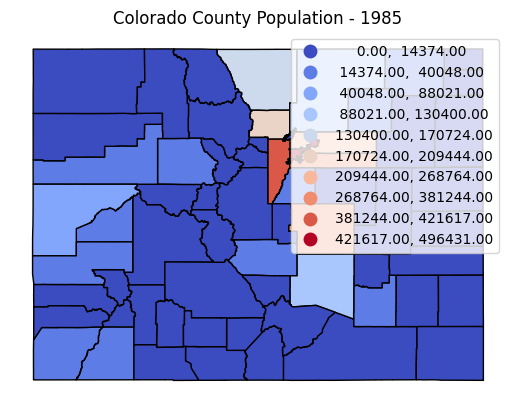

In [ ]:
# Filter for 1985 only
df_1985 = df[df['YEAR'] == 1985].copy()

# Merge again using cleaned keys
merged_1985 = gdf.merge(df_1985, left_on='COUNTY', right_on='FULL')

# Convert 'TOTAL POPULATION' to numeric, handling potential errors
merged_1985['TOTAL POPULATION'] = pd.to_numeric(merged_1985['TOTAL POPULATION'].str.replace(',', ''), errors='coerce')

# Plot
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
merged_1985.plot(column='TOTAL POPULATION', cmap='coolwarm', edgecolor='black', legend=True, scheme='natural_breaks', k=10)
plt.title('Colorado County Population - 1985')
plt.axis('off')
plt.show()

<Figure size 1200x1000 with 0 Axes>

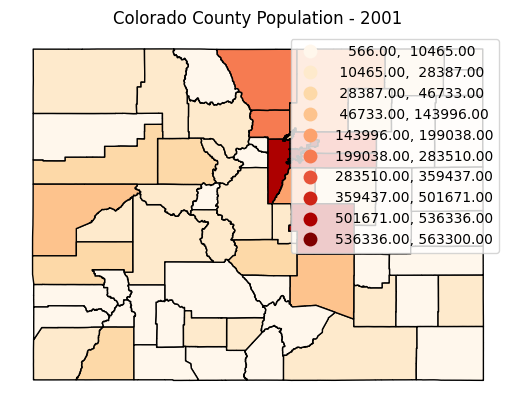

In [ ]:
# Filter for 2001 only
df_2001 = df[df['YEAR'] == 2001].copy()

# Merge again using cleaned keys
merged_2001 = gdf.merge(df_2001, left_on='COUNTY', right_on='FULL')

# Convert 'TOTAL POPULATION' to numeric, handling potential errors
merged_2001['TOTAL POPULATION'] = pd.to_numeric(merged_2001['TOTAL POPULATION'].str.replace(',', ''), errors='coerce')

# Plot
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
merged_2001.plot(column='TOTAL POPULATION', cmap='OrRd', edgecolor='black', legend=True, scheme='natural_breaks', k=10)
plt.title('Colorado County Population - 2001')
plt.axis('off')
plt.show()

<Figure size 1200x1000 with 0 Axes>

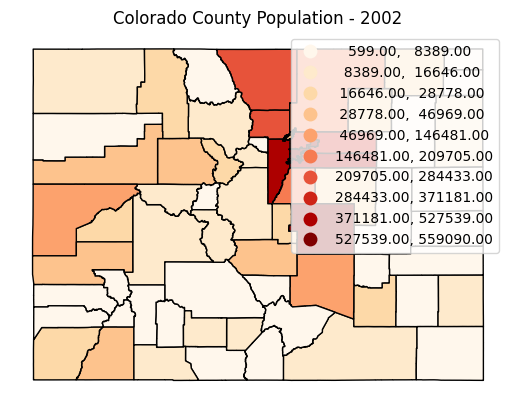

In [ ]:
# Filter for 2002 only
df_2002 = df[df['YEAR'] == 2002].copy()

# Merge again using cleaned keys
merged_2002 = gdf.merge(df_2002, left_on='COUNTY', right_on='FULL')

# Convert 'TOTAL POPULATION' to numeric, handling potential errors
merged_2002['TOTAL POPULATION'] = pd.to_numeric(merged_2002['TOTAL POPULATION'].str.replace(',', ''), errors='coerce')

# Plot
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
merged_2002.plot(column='TOTAL POPULATION', cmap='OrRd', edgecolor='black', legend=True, scheme='natural_breaks', k=10)
plt.title('Colorado County Population - 2002')
plt.axis('off')
plt.show()

<Figure size 1200x1000 with 0 Axes>

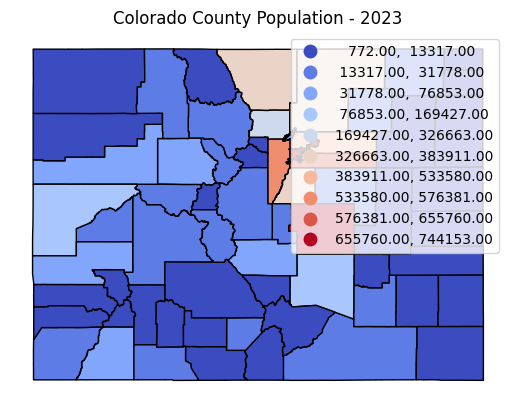

In [ ]:
 # Filter for 2023 only
df_2023 = df[df['YEAR'] == 2023].copy()

# Merge again using cleaned keys
merged_2023 = gdf.merge(df_2023, left_on='COUNTY', right_on='FULL')

# Convert 'TOTAL POPULATION' to numeric, handling potential errors
merged_2023['TOTAL POPULATION'] = pd.to_numeric(merged_2023['TOTAL POPULATION'].str.replace(',', ''), errors='coerce')

# Plot
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
merged_2023.plot(column='TOTAL POPULATION', cmap='coolwarm', edgecolor='black', legend=True, scheme='natural_breaks', k=10)
plt.title('Colorado County Population - 2023')
plt.axis('off')
plt.show()

# Use subplot for maps***

<Figure size 1200x1000 with 0 Axes>

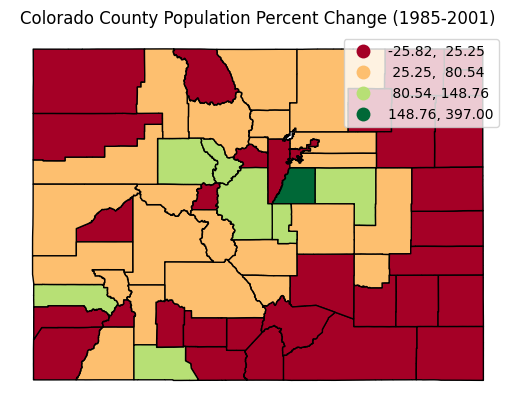

In [ ]:
# Step 1: Prepare data for 1985 and 2001
df_1985_2001 = df[df['YEAR'].isin([1985, 2001])].copy()

# Convert 'TOTAL POPULATION' to numeric
df_1985_2001['TOTAL POPULATION'] = pd.to_numeric(df_1985_2001['TOTAL POPULATION'].str.replace(',', ''), errors='coerce')

# Pivot the table to have years as columns
pivot_df = df_1985_2001.pivot(index='FULL', columns='YEAR', values='TOTAL POPULATION')

# Step 2: Calculate percent change for 1985-2001
# Calculate percent change: (Population in 2001 - Population in 1985) / Population in 1985 * 100
pivot_df['PERCENT_CHANGE_1985_2001'] = ((pivot_df[2001] - pivot_df[1985]) / pivot_df[1985]) * 100

# Replace infinite values with NaN
pivot_df.replace([float('inf'), float('-inf')], float('nan'), inplace=True)

# Reset index to merge with gdf
percent_change_1985_2001 = pivot_df.reset_index()

# Clean up and normalize merge keys for percent change data
percent_change_1985_2001['FULL'] = percent_change_1985_2001['FULL'].str.strip().str.upper()

# Step 3: Merge 1985-2001 percent change with geodataframe
merged_percent_change_1985_2001 = gdf.merge(percent_change_1985_2001, left_on='COUNTY', right_on='FULL')

# Step 4: Plot percent change for 1985-2001
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
merged_percent_change_1985_2001.plot(column='PERCENT_CHANGE_1985_2001', cmap='RdYlGn', edgecolor='black', legend=True, scheme='natural_breaks', k=4)
plt.title('Colorado County Population Percent Change (1985-2001)')
plt.axis('off')
plt.show()

<Figure size 1200x1000 with 0 Axes>

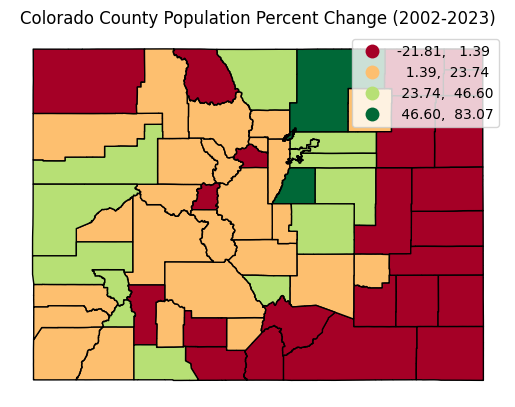

In [ ]:
# Step 5: Prepare data for 2002 and 2023
df_2002_2023 = df[df['YEAR'].isin([2002, 2023])].copy()

# Convert 'TOTAL POPULATION' to numeric
df_2002_2023['TOTAL POPULATION'] = pd.to_numeric(df_2002_2023['TOTAL POPULATION'].str.replace(',', ''), errors='coerce')

# Pivot the table to have years as columns
pivot_df_2002_2023 = df_2002_2023.pivot(index='FULL', columns='YEAR', values='TOTAL POPULATION')

# Step 6: Calculate percent change for 2002-2023
# Calculate percent change: (Population in 2023 - Population in 2002) / Population in 2002 * 100
pivot_df_2002_2023['PERCENT_CHANGE_2002_2023'] = ((pivot_df_2002_2023[2023] - pivot_df_2002_2023[2002]) / pivot_df_2002_2023[2002]) * 100

# Replace infinite values with NaN
pivot_df_2002_2023.replace([float('inf'), float('-inf')], float('nan'), inplace=True)

# Reset index to merge with gdf
percent_change_2002_2023 = pivot_df_2002_2023.reset_index()

# Clean up and normalize merge keys for percent change data
percent_change_2002_2023['FULL'] = percent_change_2002_2023['FULL'].str.strip().str.upper()

# Step 7: Merge 2002-2023 percent change with geodataframe
merged_percent_change_2002_2023 = gdf.merge(percent_change_2002_2023, left_on='COUNTY', right_on='FULL')

# Step 8: Plot percent change for 2002-2023
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
merged_percent_change_2002_2023.plot(column='PERCENT_CHANGE_2002_2023', cmap='RdYlGn', edgecolor='black', legend=True, scheme='natural_breaks', k=4)
plt.title('Colorado County Population Percent Change (2002-2023)')
plt.axis('off')
plt.show()

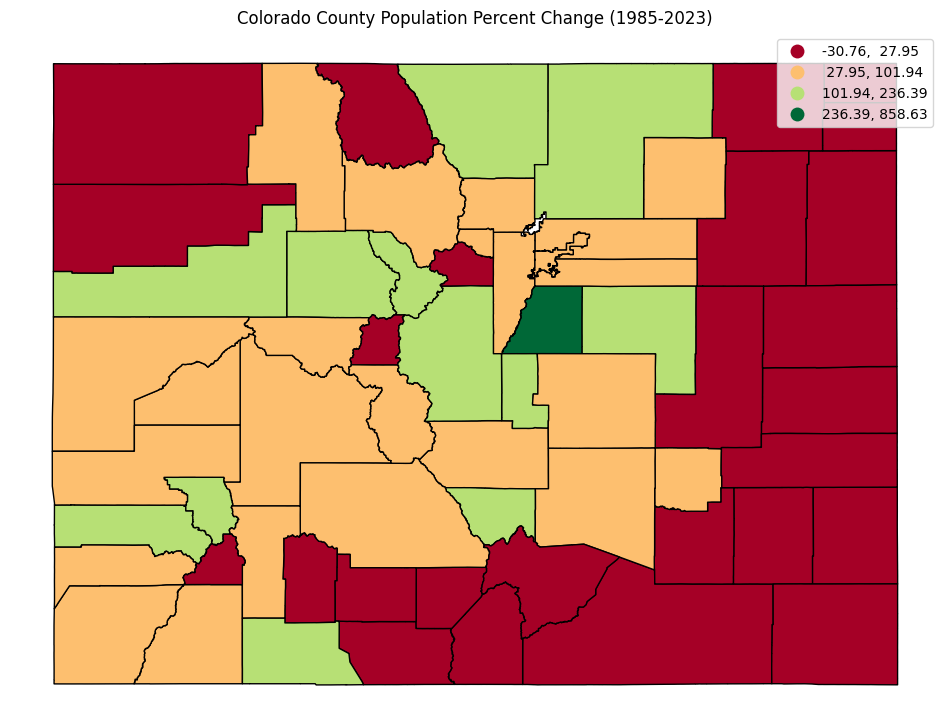

In [ ]:
# Prepare data for 1985 and 2023
df_1985_2023 = df[df['YEAR'].isin([1985, 2023])].copy()

# Convert 'TOTAL POPULATION' to numeric
df_1985_2023['TOTAL POPULATION'] = pd.to_numeric(df_1985_2023['TOTAL POPULATION'].str.replace(',', ''), errors='coerce')

# Pivot the table to have years as columns
pivot_df_1985_2023 = df_1985_2023.pivot(index='FULL', columns='YEAR', values='TOTAL POPULATION')

# Calculate percent change for 1985-2023
# Calculate percent change: (Population in 2023 - Population in 1985) / Population in 1985 * 100
pivot_df_1985_2023['PERCENT_CHANGE_1985_2023'] = ((pivot_df_1985_2023[2023] - pivot_df_1985_2023[1985]) / pivot_df_1985_2023[1985]) * 100

# Replace infinite values with NaN
pivot_df_1985_2023.replace([float('inf'), float('-inf')], float('nan'), inplace=True)

# Reset index to merge with gdf
percent_change_1985_2023 = pivot_df_1985_2023.reset_index()

# Clean up and normalize merge keys for percent change data
percent_change_1985_2023['FULL'] = percent_change_1985_2023['FULL'].str.strip().str.upper()

# Merge 1985-2023 percent change with geodataframe
merged_percent_change_1985_2023 = gdf.merge(percent_change_1985_2023, left_on='COUNTY', right_on='FULL')

# Plot
fig, ax = plt.subplots(1, 1, figsize=(12, 10))
merged_percent_change_1985_2023.plot(column='PERCENT_CHANGE_1985_2023', ax=ax, cmap='RdYlGn', edgecolor='black', legend=True, scheme='natural_breaks', k=4)
ax.set_title('Colorado County Population Percent Change (1985-2023)')
ax.set_axis_off()


plt.show()

In [ ]:
import folium
import json
import numpy as np
from folium.features import GeoJsonTooltip


# Ensure the data is in a format Folium can use (GeoJSON)
# We already have merged_percent_change_1985_2023 GeoDataFrame

# Create a Folium map centered around Colorado
# You might need to adjust the location and zoom level
m = folium.Map(location=[39.5, -105.5], zoom_start=6)

# Define the custom bins
# Use finite numbers that encompass the data range instead of infinities
min_val = merged_percent_change_1985_2023['PERCENT_CHANGE_1985_2023'].min() if merged_percent_change_1985_2023['PERCENT_CHANGE_1985_2023'].min() < 0 else -1 # Ensure the minimum bin starts below 0 if there are negative values
max_val = merged_percent_change_1985_2023['PERCENT_CHANGE_1985_2023'].max() if merged_percent_change_1985_2023['PERCENT_CHANGE_1985_2023'].max() > 90 else 100 # Ensure the maximum bin ends above 90 if there are values above 90

bins = [min_val, 0, 20, 30, 40, 50, 60, 70, 80, 90, max_val]

# Adjust bins to be strictly increasing and unique
bins = sorted(list(set(bins)))

# Add the choropleth layer
folium.Choropleth(
    geo_data=merged_percent_change_1985_2023.to_json(),
    name='choropleth',
    data=merged_percent_change_1985_2023,
    columns=['FULL_y', 'PERCENT_CHANGE_1985_2023'],
    key_on='feature.properties.COUNTY',
    fill_color='RdYlGn', # Red-Yellow-Green colormap
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Population Percent Change (1985-2023)',
    bins=bins, # Use the custom bins
).add_to(m)

# Create a GeoJsonTooltip object
tooltip = GeoJsonTooltip(
    fields=['COUNTY', 'PERCENT_CHANGE_1985_2023'],
    aliases=['County:', 'Percent Change (1985-2023):'],
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 1px solid black;
        border-radius: 3px;
        box-shadow: 3px;
    """,
    geojson=merged_percent_change_1985_2023.to_json(),
)

# Add the tooltip to the choropleth layer
folium.features.GeoJson(
    json.loads(merged_percent_change_1985_2023.to_json()),
    tooltip=tooltip
).add_to(m)


# Add a layer control
folium.LayerControl().add_to(m)

# Display the map
m

In [ ]:
m.save('colorado_population_change_map.html')

In [ ]:
# Convert the GeoDataFrame to GeoJSON format
geojson_data = merged_percent_change_1985_2023.to_json()

# Define the output file path
geojson_output_path = '/content/drive/MyDrive/ESIIL Project Data/Colorado_Population_Percent_Change_1985_2023.geojson'

# Save the GeoJSON data to a file
with open(geojson_output_path, 'w') as f:
    f.write(geojson_data)

print(f"GeoJSON file saved to: {geojson_output_path}")

GeoJSON file saved to: /content/drive/MyDrive/ESIIL Project Data/Colorado_Population_Percent_Change_1985_2023.geojson


In [ ]:
# Filter the dataframe for Douglas County and the years 1985 and 2022
douglas_pop_data = df[(df['FULL'] == 'DOUGLAS') & (df['YEAR'].isin([1985, 2022]))].copy()

# Convert 'TOTAL POPULATION' to numeric
douglas_pop_data['TOTAL POPULATION'] = pd.to_numeric(douglas_pop_data['TOTAL POPULATION'].str.replace(',', ''), errors='coerce')

# Pivot the table to easily access the population for each year
douglas_pivot = douglas_pop_data.pivot(index='FULL', columns='YEAR', values='TOTAL POPULATION')

# Calculate the percent change
population_1985 = douglas_pivot.loc['DOUGLAS', 1985]
population_2022 = douglas_pivot.loc['DOUGLAS', 2022]

percent_change_douglas = ((population_2022 - population_1985) / population_1985) * 100

print(f"The population percent change for Douglas County between 1985 and 2022 is: {percent_change_douglas:.2f}%")

The population percent change for Douglas County between 1985 and 2022 is: 838.77%


In [ ]:
# Filter the dataframe for Eagle County and the years 1985 and 2022
eagle_pop_data = df[(df['FULL'] == 'EAGLE') & (df['YEAR'].isin([1985, 2022]))].copy()

# Convert 'TOTAL POPULATION' to numeric
eagle_pop_data['TOTAL POPULATION'] = pd.to_numeric(eagle_pop_data['TOTAL POPULATION'].str.replace(',', ''), errors='coerce')

# Pivot the table to easily access the population for each year
eagle_pivot = eagle_pop_data.pivot(index='FULL', columns='YEAR', values='TOTAL POPULATION')

# Calculate the percent change
population_1985_eagle = eagle_pivot.loc['EAGLE', 1985]
population_2022_eagle = eagle_pivot.loc['EAGLE', 2022]

percent_change_eagle = ((population_2022_eagle - population_1985_eagle) / population_1985_eagle) * 100

print(f"The population percent change for Eagle County between 1985 and 2022 is: {percent_change_eagle:.2f}%")

The population percent change for Eagle County between 1985 and 2022 is: 206.42%


In [ ]:
# Filter the dataframe for Logan County and the years 1985 and 2022
logan_pop_data = df[(df['FULL'] == 'LOGAN') & (df['YEAR'].isin([1985, 2022]))].copy()

# Convert 'TOTAL POPULATION' to numeric
logan_pop_data['TOTAL POPULATION'] = pd.to_numeric(logan_pop_data['TOTAL POPULATION'].str.replace(',', ''), errors='coerce')

# Pivot the table to easily access the population for each year
logan_pivot = logan_pop_data.pivot(index='FULL', columns='YEAR', values='TOTAL POPULATION')

# Calculate the percent change
population_1985_logan = logan_pivot.loc['LOGAN', 1985]
population_2022_logan = logan_pivot.loc['LOGAN', 2022]

percent_change_logan = ((population_2022_logan - population_1985_logan) / population_1985_logan) * 100

print(f"The population percent change for Logan County between 1985 and 2022 is: {percent_change_logan:.2f}%")

The population percent change for Logan County between 1985 and 2022 is: 9.11%


In [ ]:
# Filter the dataframe for Logan County and the years 2001 and 2022
logan_pop_data_01_22 = df[(df['FULL'] == 'LOGAN') & (df['YEAR'].isin([2001, 2022]))].copy()

# Convert 'TOTAL POPULATION' to numeric
logan_pop_data_01_22['TOTAL POPULATION'] = pd.to_numeric(logan_pop_data_01_22['TOTAL POPULATION'].str.replace(',', ''), errors='coerce')

# Pivot the table to easily access the population for each year
logan_pivot_01_22 = logan_pop_data_01_22.pivot(index='FULL', columns='YEAR', values='TOTAL POPULATION')

# Calculate the percent change
population_2001_logan = logan_pivot_01_22.loc['LOGAN', 2001]
population_2022_logan = logan_pivot_01_22.loc['LOGAN', 2022]

percent_change_logan_01_22 = ((population_2022_logan - population_2001_logan) / population_2001_logan) * 100

print(f"The population percent change for Logan County between 2001 and 2022 is: {percent_change_logan_01_22:.2f}%")

The population percent change for Logan County between 2001 and 2022 is: -6.96%
